In [1]:
import numpy as np
import pandas as pd
import gzip
import json

from pprint import pprint
import nltk
from nltk.corpus import stopwords
from sklearn.model_selection import StratifiedKFold
import optuna
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import xgboost as xgb
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import roc_auc_score

nltk.download('stopwords')
turkish_stopwords = stopwords.words('turkish')

[nltk_data] Downloading package stopwords to /Users/eren/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
# 1) Read train_classification.csv more carefully
train_classification_df = pd.read_csv("train-classification.csv")

# If "Unnamed: 0" is your user_id (and there's no user_id column yet), rename it
if "Unnamed: 0" in train_classification_df.columns and "user_id" not in train_classification_df.columns:
    train_classification_df.rename(columns={"Unnamed: 0": "user_id"}, inplace=True)
    
# Rename "label" to "category"
train_classification_df.rename(columns={"label": "category"}, inplace=True)

# 2) Read & unify the 3 annotation files in a loop
annotation_files = [
    "annotated_users_CS412-70f170887437.csv",
    "annotated_users_CS412-1210cecaf90d.csv",
    "annotated_users_CS412-2fa73b22df12.csv",
]

all_annotated = []
for ann_file in annotation_files:
    df_temp = pd.read_csv(ann_file)
    
    # Rename "Unnamed: 0" to "user_id" if needed
    if "Unnamed: 0" in df_temp.columns and "user_id" not in df_temp.columns:
        df_temp.rename(columns={"Unnamed: 0": "user_id"}, inplace=True)
    
    # Rename influencerCategory to category
    if "influencerCategory" in df_temp.columns:
        df_temp.rename(columns={"influencerCategory": "category"}, inplace=True)
    
    # Drop rows missing a category
    df_temp.dropna(subset=["category"], inplace=True)
    
    # Lowercase the category
    df_temp["category"] = df_temp["category"].str.lower()
    
    # Drop any unwanted columns that might exist
    for col in ["url", "influencerMention", "accountType"]:
        if col in df_temp.columns:
            df_temp.drop(columns=col, inplace=True)
    
    df_temp.reset_index(drop=True, inplace=True)
    all_annotated.append(df_temp)

annotated_users_df = pd.concat(all_annotated, ignore_index=True)

# 3) Combine with your train_classification_df
train_classification_df = pd.concat([train_classification_df, annotated_users_df],
                                    ignore_index=True)

# 4) Unify labels (make sure everything is lowercase, etc.)
train_classification_df["category"] = train_classification_df["category"].str.lower()

# 5) Remove duplicate user_ids if they appear multiple times
#    keep="last" keeps the final row of any duplicates
train_classification_df.drop_duplicates(subset="user_id", keep="last", inplace=True)
train_classification_df.reset_index(drop=True, inplace=True)

# 6) Create your mapping of user_id → category
username2_category = train_classification_df.set_index("user_id")["category"].to_dict()

In [3]:
train_data_path = "training-dataset.jsonl.gz"

username2posts_train = dict()
username2profile_train = dict()

username2posts_test = dict()
username2profile_test = dict()


with gzip.open(train_data_path, "rt") as fh:
  for line in fh:
    sample = json.loads(line)

    profile = sample["profile"]
    username = profile["username"]
    if username in username2_category:
      # train data info
      username2posts_train[username] = sample["posts"]
      username2profile_train[username] = profile


    else:
      # it is test data info
      username2posts_test[username] = sample["posts"]
      username2profile_test[username] = profile

In [4]:
# Profile Dataframe
train_profile_df = pd.DataFrame(username2profile_train).T.reset_index(drop=True)
test_profile_df = pd.DataFrame(username2profile_test).T.reset_index(drop=True)

In [5]:
# profile: category_name biography entities business_category_name category_enum username full_name
# posts: captions

In [6]:
from sklearn.feature_extraction.text import TfidfVectorizer
import re

def preprocess_text(text: str):
    # lower casing Turkish Text, Don't use str.lower :)
    text = text.casefold()
    # Remove URLs
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    # Remove special characters and punctuation
    # HERE THE EMOJIS stuff are being removed, you may want to keep them :D
    text = re.sub(r'[^a-zçğıöşü0-9\s#@]', '', text)
    # Remove numbers
    text = re.sub(r'\d+', '', text)
    # Remove extra whitespaces
    text = re.sub(r'\s+', ' ', text).strip()
    return text

def build_corpus(username2posts, username2profile, include_all_features=True):
    corpus = []
    usernames = []
    for username, posts in username2posts.items():
        usernames.append(username)
        # Aggregating the posts per user
        cleaned_captions = []
        for post in posts:
            post_caption = post.get("caption", "")
            if post_caption is None:
                continue
            post_caption = preprocess_text(post_caption)
            if post_caption != "":
                cleaned_captions.append(post_caption)
        
        # Optionally include the features
        if include_all_features:
            profile = username2profile.get(username, {})
            # Collect all relevant profile features
            feature_texts = []
            profile_fields = ["biography", "category_name", "entities", 
                            "business_category_name", "category_enum", "full_name"]
            
            for field in profile_fields:
                value = profile.get(field, "")
                if value:
                    if isinstance(value, (dict, list)):
                        # Convert complex objects to string
                        value = str(value)
                    feature_texts.append(value)
            
            # Combine and preprocess all features
            if feature_texts:
                features = " ".join(feature_texts)
                features = preprocess_text(features)
                if features != "":
                    cleaned_captions.append(features)
        
        # Joining the posts (and features) of each user with a newline
        user_text = "\n".join(cleaned_captions)
        corpus.append(user_text)
    
    return corpus, usernames

# Build training corpus with biographies
corpus_train, train_usernames = build_corpus(username2posts_train, username2profile_train, include_all_features=True)

# Initialize the TF-IDF vectorizer with Turkish stopwords and smoothing
vectorizer = TfidfVectorizer(stop_words=turkish_stopwords, max_features=1000, smooth_idf=True)

# Fit the vectorizer on the combined corpus of captions and biographies
vectorizer.fit(corpus_train)

# Transform the training data into vectors
x_post_train = vectorizer.transform(corpus_train)
y_train = [username2_category.get(uname, "NA") for uname in train_usernames]

# Build test corpus with biographies
corpus_test, test_usernames = build_corpus(username2posts_test, username2profile_test, include_all_features=True)

# Transform the test data into vectors (no fitting)
x_post_test = vectorizer.transform(corpus_test)

# Ensure there are no "NA" labels in training data
assert y_train.count("NA") == 0, "Some training samples have 'NA' as category."

# Retrieve feature names from the vectorizer
feature_names = vectorizer.get_feature_names_out()

# Convert the training TF-IDF matrix to a DataFrame (optional)
df_tfidf = pd.DataFrame(x_post_train.toarray(), columns=feature_names)

In [7]:
df_tfidf

,about,adana,adet,adres,adım,adına,afiyet,ahmet,aile,ailesi,...,üzerinde,üzerinden,üzerine,üç,şehir,şehrin,şeker,şekilde,şimdi,şık
0,0.0,0.0,0.000000,0.0,0.0,0.070027,0.000000,0.000000,0.0,0.000000,...,0.000000,0.127153,0.000000,0.000000,0.000000,0.233327,0.000000,0.000000,0.000000,0.072448
1,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.037236,0.000000
2,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.088086,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.0,0.0,0.061784,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.056739,0.026298,0.000000,0.032977,0.000000,0.000000,0.042131,0.045033,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2824,0.0,0.0,0.020900,0.0,0.0,0.000000,0.050392,0.000000,0.0,0.000000,...,0.000000,0.038387,0.000000,0.000000,0.000000,0.000000,0.142652,0.014252,0.000000,0.000000
2825,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2826,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2827,0.0,0.0,0.154691,0.0,0.0,0.000000,0.018649,0.000000,0.0,0.015313,...,0.014392,0.000000,0.000000,0.016377,0.033026,0.000000,0.017597,0.000000,0.000000,0.000000


In [8]:
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(df_tfidf, y_train, test_size=0.2, random_state=42, stratify=y_train)

[I 2024-12-27 11:38:25,492] A new study created in memory with name: no-name-689136b4-b6cb-4f72-a365-739b154737ce
[I 2024-12-27 11:38:26,821] Trial 0 finished with value: 0.5837445544941297 and parameters: {'alpha': 0.22298560131556147, 'fit_prior': True}. Best is trial 0 with value: 0.5837445544941297.
[I 2024-12-27 11:38:27,526] Trial 1 finished with value: 0.592579460430952 and parameters: {'alpha': 0.01489161468846216, 'fit_prior': False}. Best is trial 1 with value: 0.592579460430952.
[I 2024-12-27 11:38:28,235] Trial 2 finished with value: 0.601418273457188 and parameters: {'alpha': 0.00020658559448377423, 'fit_prior': False}. Best is trial 2 with value: 0.601418273457188.
[I 2024-12-27 11:38:28,404] Trial 3 finished with value: 0.5700482525542598 and parameters: {'alpha': 0.6286664216999026, 'fit_prior': True}. Best is trial 2 with value: 0.601418273457188.
[I 2024-12-27 11:38:29,082] Trial 4 finished with value: 0.6009748188087285 and parameters: {'alpha': 5.105552494338101e-05


Best parameters: {'alpha': 0.00020658559448377423, 'fit_prior': False}
Best cross-validation accuracy: 0.601418273457188

Training Data Results:
Accuracy: 0.7087936367653557

Classification Report:
                      precision    recall  f1-score   support

                 art       0.72      0.59      0.65       156
       entertainment       0.60      0.59      0.60       265
             fashion       0.70      0.76      0.73       243
                food       0.91      0.79      0.85       419
              gaming       0.81      0.93      0.87        14
health and lifestyle       0.71      0.63      0.67       422
    mom and children       0.57      0.79      0.66       116
              sports       0.85      0.84      0.85       102
                tech       0.73      0.77      0.75       286
              travel       0.55      0.68      0.61       240

            accuracy                           0.71      2263
           macro avg       0.72      0.74      0.72    

/var/folders/nf/hrcncw914s9908b7gbhwy_g00000gn/T/ipykernel_56576/3118047936.py:56: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  optuna.visualization.matplotlib.plot_optimization_history(study)


<Figure size 1000x600 with 0 Axes>

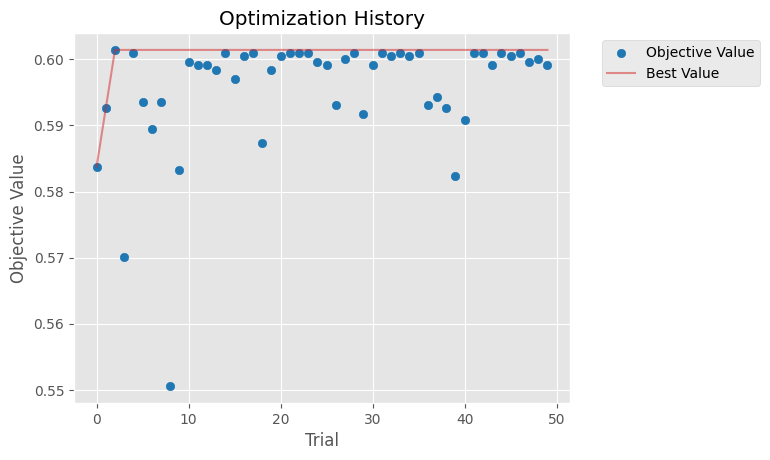

/var/folders/nf/hrcncw914s9908b7gbhwy_g00000gn/T/ipykernel_56576/3118047936.py:62: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  optuna.visualization.matplotlib.plot_param_importances(study)


<Figure size 1000x600 with 0 Axes>

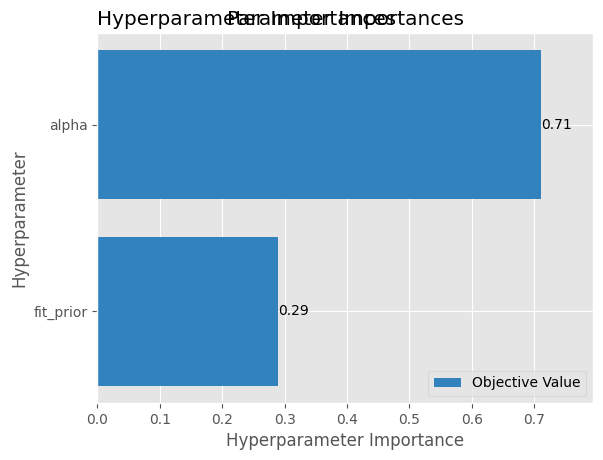

In [9]:
import optuna
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, classification_report
import matplotlib.pyplot as plt

def objective_nb(trial):
    # Define the hyperparameters for MultinomialNB
    alpha = trial.suggest_float('alpha', 1e-5, 10, log=True)  # Smoothing parameter for Naive Bayes
    fit_prior = trial.suggest_categorical('fit_prior', [True, False])  # Whether to learn class prior probabilities

    # Create and evaluate the model
    model_nb = MultinomialNB(alpha=alpha, fit_prior=fit_prior)
    
    # Perform cross-validation
    scores = cross_val_score(
        model_nb,
        x_train,
        y_train,
        cv=5,
        scoring='accuracy',
        n_jobs=-1
    )
    
    return scores.mean()

# Create and run the study
study = optuna.create_study(direction='maximize')
study.optimize(objective_nb, n_trials=50)

# Get the best parameters
best_params = study.best_params
print("\nBest parameters:", best_params)
print("Best cross-validation accuracy:", study.best_value)

# Train the final model with best parameters
final_model_nb = MultinomialNB(alpha=best_params['alpha'], fit_prior=best_params['fit_prior'])
final_model_nb.fit(x_train, y_train)

# Evaluate on training data
y_train_pred_nb = final_model_nb.predict(x_train)
print("\nTraining Data Results:")
print("Accuracy:", accuracy_score(y_train, y_train_pred_nb))
print("\nClassification Report:")
print(classification_report(y_train, y_train_pred_nb, zero_division=0))

# Evaluate on validation data
y_val_pred_nb = final_model_nb.predict(x_val)
print("\nValidation Data Results:")
print("Accuracy:", accuracy_score(y_val, y_val_pred_nb))
print("\nClassification Report:")
print(classification_report(y_val, y_val_pred_nb, zero_division=0))

# Plot the optimization history
plt.figure(figsize=(10, 6))
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.title('Optimization History')
plt.show()

# Plot parameter importances
plt.figure(figsize=(10, 6))
optuna.visualization.matplotlib.plot_param_importances(study)
plt.title('Parameter Importances')
plt.show()


Training Data Results:
Accuracy: 0.7087936367653557

Classification Report:
                      precision    recall  f1-score   support

                 art       0.72      0.59      0.65       156
       entertainment       0.60      0.59      0.60       265
             fashion       0.70      0.76      0.73       243
                food       0.91      0.79      0.85       419
              gaming       0.81      0.93      0.87        14
health and lifestyle       0.71      0.63      0.67       422
    mom and children       0.57      0.79      0.66       116
              sports       0.85      0.84      0.85       102
                tech       0.73      0.77      0.75       286
              travel       0.55      0.68      0.61       240

            accuracy                           0.71      2263
           macro avg       0.72      0.74      0.72      2263
        weighted avg       0.72      0.71      0.71      2263


Validation Data Results:
Accuracy: 0.58833922261484

/var/folders/nf/hrcncw914s9908b7gbhwy_g00000gn/T/ipykernel_56576/959012760.py:17: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  optuna.visualization.matplotlib.plot_optimization_history(study)


<Figure size 1000x600 with 0 Axes>

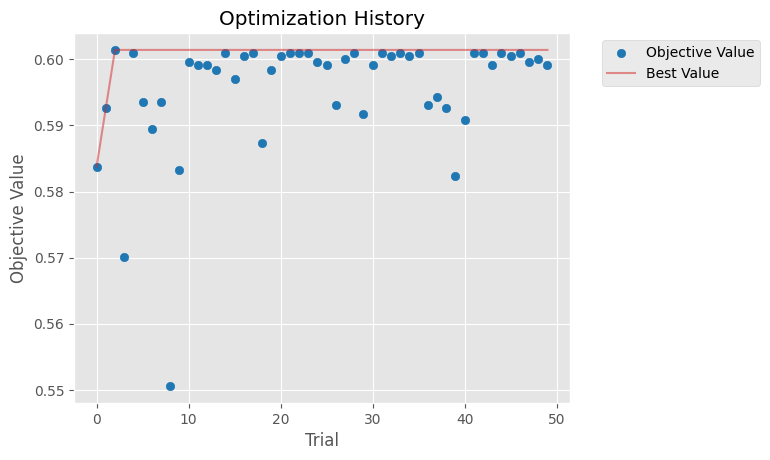

/var/folders/nf/hrcncw914s9908b7gbhwy_g00000gn/T/ipykernel_56576/959012760.py:23: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  optuna.visualization.matplotlib.plot_param_importances(study)


<Figure size 1000x600 with 0 Axes>

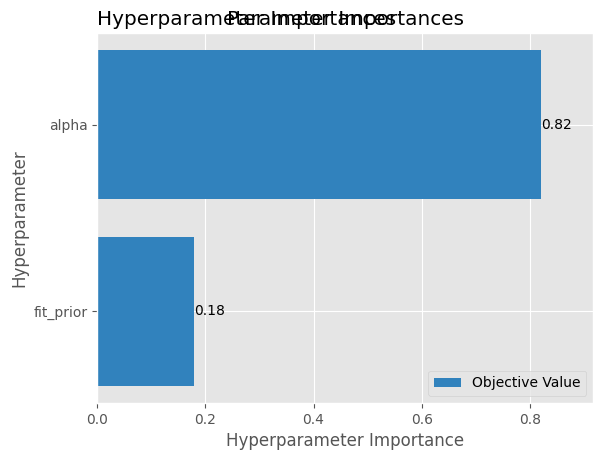

In [10]:
# Evaluate on training data
y_train_pred = final_model_nb.predict(x_train)
print("\nTraining Data Results:")
print("Accuracy:", accuracy_score(y_train, y_train_pred_nb))
print("\nClassification Report:")
print(classification_report(y_train, y_train_pred_nb, zero_division=0))

# Evaluate on validation data
y_val_pred_nb = final_model_nb.predict(x_val)
print("\nValidation Data Results:")
print("Accuracy:", accuracy_score(y_val, y_val_pred_nb))
print("\nClassification Report:")
print(classification_report(y_val, y_val_pred_nb, zero_division=0))

# Plot the optimization history
plt.figure(figsize=(10, 6))
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.title('Optimization History')
plt.show()

# Plot parameter importances
plt.figure(figsize=(10, 6))
optuna.visualization.matplotlib.plot_param_importances(study)
plt.title('Parameter Importances')
plt.show()

In [11]:
import optuna
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
import numpy as np

def objective(trial):
    # First select the solver and its corresponding penalty options
    solver_penalty = trial.suggest_categorical('solver_penalty', [
        ('lbfgs', 'l2'),
        ('liblinear', 'l1'),
        ('liblinear', 'l2'),
        ('saga', 'l1'),
        ('saga', 'l2'),
        ('saga', 'elasticnet')
    ])
    
    solver, penalty = solver_penalty
    
    # Define the base hyperparameters
    params = {
        'C': trial.suggest_float('C', 1e-5, 100, log=True),
        'max_iter': trial.suggest_int('max_iter', 100, 1000),
        'tol': trial.suggest_float('tol', 1e-5, 1e-3, log=True),
        'solver': solver,
        'penalty': penalty
    }
    
    # Add l1_ratio only for elasticnet penalty
    if penalty == 'elasticnet':
        params['l1_ratio'] = trial.suggest_float('l1_ratio', 0, 1)
    
    # Create and evaluate the model
    model_lr = LogisticRegression(**params, random_state=42)
    
    # Perform cross-validation
    scores = cross_val_score(
        model_lr,
        x_train,
        y_train,
        cv=5,
        scoring='accuracy',
        n_jobs=-1
    )
    
    return scores.mean()

# Create and run the study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

# Get the best parameters
best_params = study.best_params
print("\nBest parameters:", best_params)
print("Best cross-validation accuracy:", study.best_value)

# Convert best_params to proper format for LogisticRegression
solver, penalty = best_params['solver_penalty']
final_params = {
    'C': best_params['C'],
    'max_iter': best_params['max_iter'],
    'tol': best_params['tol'],
    'solver': solver,
    'penalty': penalty
}

if penalty == 'elasticnet':
    final_params['l1_ratio'] = best_params['l1_ratio']

# Train the final model with best parameters
final_model_lr = LogisticRegression(**final_params, random_state=42)
final_model_lr.fit(x_train, y_train)

[I 2024-12-27 11:38:37,849] A new study created in memory with name: no-name-a8bb1e1e-b33e-4208-901d-b1af04483f22
/Users/eren/Library/Python/3.9/lib/python/site-packages/optuna/distributions.py:524: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains ('lbfgs', 'l2') which is of type tuple.
  warnings.warn(message)
/Users/eren/Library/Python/3.9/lib/python/site-packages/optuna/distributions.py:524: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains ('liblinear', 'l1') which is of type tuple.
  warnings.warn(message)
/Users/eren/Library/Python/3.9/lib/python/site-packages/optuna/distributions.py:524: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains ('liblinear', 'l2') which is of type tuple.
  warnings.warn(message)
/Users/e


Best parameters: {'solver_penalty': ('saga', 'elasticnet'), 'C': 1.2425882788570972, 'max_iter': 1000, 'tol': 4.2187960190536837e-05, 'l1_ratio': 0.016485701766346228}
Best cross-validation accuracy: 0.6336683662505616


LogisticRegression(C=1.2425882788570972, l1_ratio=0.016485701766346228,
                   max_iter=1000, penalty='elasticnet', random_state=42,
                   solver='saga', tol=4.2187960190536837e-05)

 Results: LogisticRegression(C=1.2425882788570972, l1_ratio=0.016485701766346228,
                   max_iter=1000, penalty='elasticnet', random_state=42,
                   solver='saga', tol=4.2187960190536837e-05)

Training Data Results:
Accuracy: 0.790543526292532

Classification Report:
                      precision    recall  f1-score   support

                 art       0.85      0.53      0.65       156
       entertainment       0.70      0.68      0.69       265
             fashion       0.76      0.82      0.79       243
                food       0.91      0.94      0.93       419
              gaming       0.00      0.00      0.00        14
health and lifestyle       0.71      0.87      0.78       422
    mom and children       0.86      0.53      0.66       116
              sports       0.96      0.68      0.79       102
                tech       0.76      0.88      0.82       286
              travel       0.82      0.77      0.79       240

            accuracy   

/var/folders/nf/hrcncw914s9908b7gbhwy_g00000gn/T/ipykernel_56576/1639284388.py:20: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  optuna.visualization.matplotlib.plot_optimization_history(study)


<Figure size 1000x600 with 0 Axes>

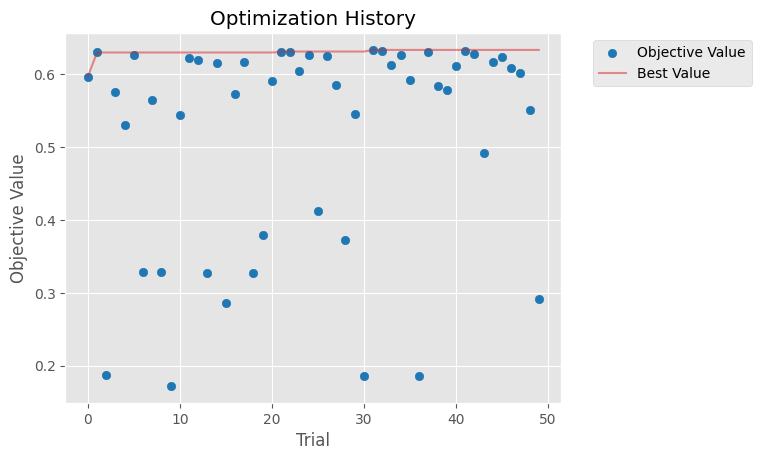

/var/folders/nf/hrcncw914s9908b7gbhwy_g00000gn/T/ipykernel_56576/1639284388.py:26: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  optuna.visualization.matplotlib.plot_param_importances(study)


<Figure size 1000x600 with 0 Axes>

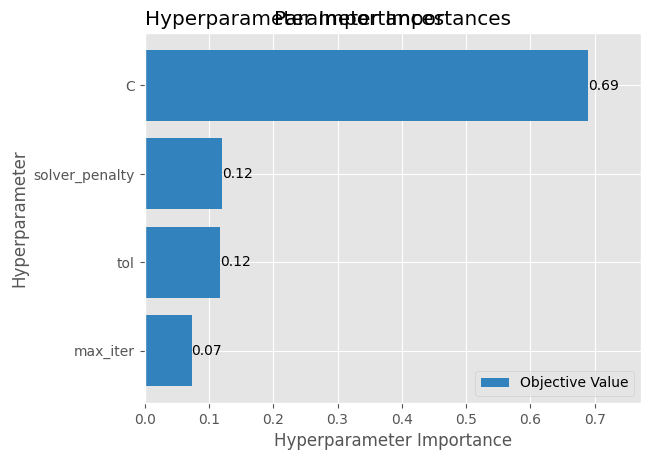

In [13]:
# Evaluate on training data
y_train_pred_lr = final_model_lr.predict(x_train)
print(" Results:", final_model_lr)
print("\nTraining Data Results:")
print("Accuracy:", accuracy_score(y_train, y_train_pred_lr))
print("\nClassification Report:")
print(classification_report(y_train, y_train_pred_lr, zero_division=0))

# Evaluate on validation data
y_val_pred_lr = final_model_lr.predict(x_val)
print("\nValidation Data Results:")
print("Accuracy:", accuracy_score(y_val, y_val_pred_lr))
print("\nClassification Report:")
print(classification_report(y_val, y_val_pred_lr, zero_division=0))

# Plot the optimization history
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.title('Optimization History')
plt.show()

# Plot parameter importances
plt.figure(figsize=(10, 6))
optuna.visualization.matplotlib.plot_param_importances(study)
plt.title('Parameter Importances')
plt.show()

[I 2024-12-27 11:45:52,766] A new study created in memory with name: no-name-429c8737-fd8e-4031-8f38-32d93305a743
/Users/eren/Library/Python/3.9/lib/python/site-packages/xgboost/core.py:160: UserWarning: [11:45:53] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/eren/Library/Python/3.9/lib/python/site-packages/xgboost/core.py:160: UserWarning: [11:45:53] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/eren/Library/Python/3.9/lib/python/site-packages/xgboost/core.py:160: UserWarning: [11:45:53] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/eren/Library/Python/3.9/lib/python/site-packages/xgboost/core.py:160: UserWarning: [11:45:53] WARNING: /Users/runner/work/xgbo


Best parameters: {'learning_rate': 0.010591695140757952, 'max_depth': 10, 'n_estimators': 187, 'subsample': 0.5701461323246498, 'colsample_bytree': 0.5007997464122614, 'gamma': 1.9451338047204103, 'lambda': 0.020630452375197606, 'alpha': 0.0006913843107425256, 'scale_pos_weight': 5}
Best cross-validation accuracy: 0.6385375764324367

Training Data Results:
Accuracy: 0.9509500662836942

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.90      0.94       156
           1       0.97      0.92      0.94       265
           2       0.89      0.97      0.93       243
           3       0.95      0.99      0.97       419
           4       1.00      0.71      0.83        14
           5       0.95      0.95      0.95       422
           6       0.99      0.95      0.97       116
           7       0.99      0.90      0.94       102
           8       0.95      0.98      0.96       286
           9       0.95      0.95      0.95   

/var/folders/nf/hrcncw914s9908b7gbhwy_g00000gn/T/ipykernel_56576/1073016370.py:76: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  optuna.visualization.matplotlib.plot_optimization_history(study)


<Figure size 1000x600 with 0 Axes>

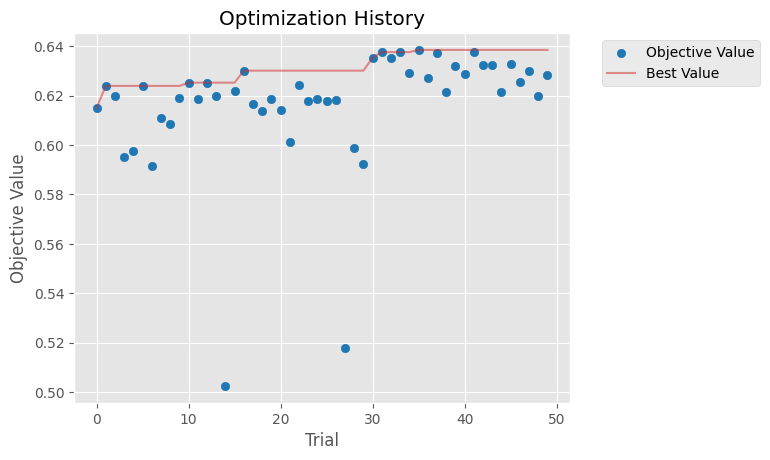

/var/folders/nf/hrcncw914s9908b7gbhwy_g00000gn/T/ipykernel_56576/1073016370.py:82: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  optuna.visualization.matplotlib.plot_param_importances(study)


<Figure size 1000x600 with 0 Axes>

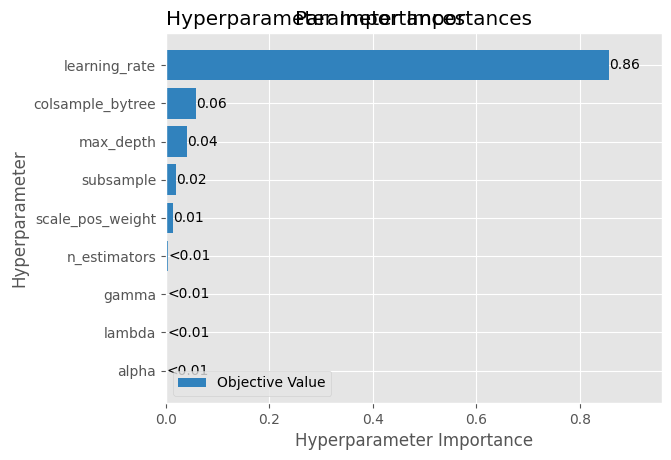

In [15]:
import optuna
import xgboost as xgb
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report
import matplotlib.pyplot as plt

# Initialize LabelEncoder to convert string labels to integers
label_encoder = LabelEncoder()

# Fit the LabelEncoder to y_train to transform string labels into integer labels
y_train_encoded = label_encoder.fit_transform(y_train)

def objective(trial):
    # Define hyperparameters for XGBoost
    param = {
        'objective': 'multi:softmax',  # Specify multiclass classification
        'num_class': len(np.unique(y_train_encoded)),  # Number of classes
        'learning_rate': trial.suggest_float('learning_rate', 1e-5, 1, log=True),  # Learning rate
        'max_depth': trial.suggest_int('max_depth', 3, 10),  # Maximum depth of trees
        'n_estimators': trial.suggest_int('n_estimators', 50, 200),  # Number of boosting rounds
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),  # Fraction of samples used for training each tree
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),  # Fraction of features used for each tree
        'gamma': trial.suggest_float('gamma', 0, 5),  # Regularization term
        'lambda': trial.suggest_float('lambda', 1e-5, 1, log=True),  # L2 regularization
        'alpha': trial.suggest_float('alpha', 1e-5, 1, log=True),  # L1 regularization
        'scale_pos_weight': trial.suggest_int('scale_pos_weight', 1, 10),  # Balancing positive and negative classes
        'random_state': 42  # Ensure reproducibility
    }

    # Create the XGBoost model
    model_xgb = xgb.XGBClassifier(**param)

    # Perform cross-validation with the encoded target labels
    scores = cross_val_score(
        model_xgb,
        x_train,
        y_train_encoded,  # Use the encoded labels here
        cv=5,
        scoring='accuracy',
        n_jobs=-1
    )
    
    return scores.mean()

# Create and run the study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

# Get the best parameters
best_params = study.best_params
print("\nBest parameters:", best_params)
print("Best cross-validation accuracy:", study.best_value)

# Train the final model with best parameters
final_model = xgb.XGBClassifier(**best_params)
final_model.fit(x_train, y_train_encoded)  # Use the encoded labels for training

# Evaluate on training data
y_train_pred = final_model.predict(x_train)
print("\nTraining Data Results:")
print("Accuracy:", accuracy_score(y_train_encoded, y_train_pred))
print("\nClassification Report:")
print(classification_report(y_train_encoded, y_train_pred, zero_division=0))

# Evaluate on validation data
y_val_encoded = label_encoder.transform(y_val)  # Transform validation labels to integers
y_val_pred = final_model.predict(x_val)
print("\nValidation Data Results:")
print("Accuracy:", accuracy_score(y_val_encoded, y_val_pred))
print("\nClassification Report:")
print(classification_report(y_val_encoded, y_val_pred, zero_division=0))

# Plot the optimization history
plt.figure(figsize=(10, 6))
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.title('Optimization History')
plt.show()

# Plot parameter importances
plt.figure(figsize=(10, 6))
optuna.visualization.matplotlib.plot_param_importances(study)
plt.title('Parameter Importances')
plt.show()

In [26]:
import optuna
import lightgbm as lgb
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report
import matplotlib.pyplot as plt

def objective(trial):
    # Define hyperparameters for LightGBM
    param = {
        'objective': 'multiclass',  # Specify multiclass classification
        'num_class': len(np.unique(y_train_encoded)),  # Number of classes
        'learning_rate': trial.suggest_float('learning_rate', 1e-5, 1, log=True),  # Learning rate
        'num_leaves': trial.suggest_int('num_leaves', 10, 46),  # Number of leaves in each tree
        'max_depth': trial.suggest_int('max_depth', -1, 10),  # Maximum depth of trees
        'n_estimators': trial.suggest_int('n_estimators', 50, 100),  # Number of boosting rounds
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),  # Fraction of samples used for training each tree
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),  # Fraction of features used for each tree
        'lambda_l2': trial.suggest_float('lambda_l2', 1e-5, 1, log=True),  # L2 regularization
        'alpha': trial.suggest_float('alpha', 1e-5, 1, log=True),  # L1 regularization
        'random_state': 42  # Ensure reproducibility
    }

    # Create the LightGBM model
    model_lgbm = lgb.LGBMClassifier(**param)

    # Perform cross-validation with the encoded target labels
    scores = cross_val_score(
        model_lgbm,
        x_train,
        y_train_encoded,  # Use the encoded labels here
        cv=5,
        scoring='accuracy',
        n_jobs=-1
    )
    
    return scores.mean()

# Create and run the study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

# Get the best parameters
best_params = study.best_params
print("\nBest parameters:", best_params)
print("Best cross-validation accuracy:", study.best_value)

# Train the final model with best parameters
final_model = lgb.LGBMClassifier(**best_params)
final_model.fit(x_train, y_train_encoded)  # Use the encoded labels for trainingzZ

[I 2024-12-27 13:40:59,780] A new study created in memory with name: no-name-1c092609-1aab-4ada-bc73-86cfb1f3ed7a
/Users/eren/Library/Python/3.9/lib/python/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
/Users/eren/Library/Python/3.9/lib/python/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
/Users/eren/Library/Python/3.9/lib/python/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip insta

[LightGBM] [Warning] lambda_l2 is set=0.0002451147486273565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002451147486273565
[LightGBM] [Warning] lambda_l2 is set=0.0002451147486273565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002451147486273565
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.176216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 71238
[LightGBM] [Info] Number of data points in the train set: 1811, number of used features: 997
[LightGBM] [Info] Start training from score -2.673321
[LightGBM] [Info] Start training from score -2.145048
[LightGBM] [Info] Start training from score -2.228635
[LightGBM] [Info] Start training from score -1.687504
[LightGBM] [Info] Start training from score -5.103739
[LightGBM] [Info] Start training from score -1.678589
[LightGBM] [Info] Start training from scor

/Users/eren/Library/Python/3.9/lib/python/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
/Users/eren/Library/Python/3.9/lib/python/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Warning] lambda_l2 is set=9.342493300200043e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.342493300200043e-05
[LightGBM] [Warning] lambda_l2 is set=9.342493300200043e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.342493300200043e-05
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.200072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 71091
[LightGBM] [Info] Number of data points in the train set: 1811, number of used features: 998
[LightGBM] [Info] Start training from score -2.673321
[LightGBM] [Info] Start training from score -2.145048
[LightGBM] [Info] Start training from score -2.228635
[LightGBM] [Info] Start training from score -1.687504
[LightGBM] [Info] Start training from score -5.103739
[LightGBM] [Info] Start training from score -1.678589
[LightGBM] [Info] Start training from score -2.979846
[LightGBM] [Info] Start training from score -3.09491

[I 2024-12-27 13:41:23,024] Trial 2 finished with value: 0.3433530641348727 and parameters: {'learning_rate': 0.00014676057241387675, 'num_leaves': 38, 'max_depth': 10, 'n_estimators': 65, 'subsample': 0.5621553391961944, 'colsample_bytree': 0.5234430453117315, 'lambda_l2': 0.0018541523514257743, 'alpha': 0.0010287731440834277}. Best is trial 0 with value: 0.6252925433198538.
/Users/eren/Library/Python/3.9/lib/python/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Warning] lambda_l2 is set=0.0002451147486273565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002451147486273565
[LightGBM] [Warning] lambda_l2 is set=0.0002451147486273565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002451147486273565
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.187054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 71145
[LightGBM] [Info] Number of data points in the train set: 1810, number of used features: 997
[LightGBM] [Info] Start training from score -2.672768
[LightGBM] [Info] Start training from score -2.144496
[LightGBM] [Info] Start training from score -2.233224
[LightGBM] [Info] Start training from score -1.683971
[LightGBM] [Info] Start training from score -5.103187
[LightGBM] [Info] Start training from score -1.678036
[LightGBM] [Info] Start training from score -2.968483
[LightGBM] [Info] Start training from score -3.10663

[I 2024-12-27 13:41:39,526] Trial 3 finished with value: 0.5148059153333724 and parameters: {'learning_rate': 0.003233761635366232, 'num_leaves': 20, 'max_depth': -1, 'n_estimators': 82, 'subsample': 0.6180454306333658, 'colsample_bytree': 0.9697929039257536, 'lambda_l2': 0.0006914074817610858, 'alpha': 0.0028638043475099797}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] lambda_l2 is set=0.0002451147486273565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002451147486273565
[LightGBM] [Warning] lambda_l2 is set=0.0002451147486273565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002451147486273565
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.174435 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 70248
[LightGBM] [Info] Number of data points in the train set: 1810, number of used features: 998
[LightGBM] [Info] Start training from score -2.680801
[LightGBM] [Info] Start training from score -2.144496
[LightGBM] [Info] Start training from score -2.233224
[LightGBM] [Info] Start training from score -1.686952
[LightGBM] [Info] Start training from score -5.016175
[LightGBM] [Info] Start training from score -1.680999
[LightGBM] [Info] Start training from scor

[I 2024-12-27 13:41:46,489] Trial 4 finished with value: 0.3309793119615542 and parameters: {'learning_rate': 0.00019176069904772242, 'num_leaves': 11, 'max_depth': 4, 'n_estimators': 75, 'subsample': 0.6422473604615642, 'colsample_bytree': 0.8102952262473868, 'lambda_l2': 4.656901111791439e-05, 'alpha': 0.02879715539808139}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] lambda_l2 is set=0.0002451147486273565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002451147486273565
[LightGBM] [Warning] lambda_l2 is set=0.0002451147486273565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002451147486273565
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.173890 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 70463
[LightGBM] [Info] Number of data points in the train set: 1810, number of used features: 997
[LightGBM] [Info] Start training from score -2.672768
[LightGBM] [Info] Start training from score -2.144496
[LightGBM] [Info] Start training from score -2.233224
[LightGBM] [Info] Start training from score -1.686952
[LightGBM] [Info] Start training from score -5.103187
[LightGBM] [Info] Start training from score -1.680999
[LightGBM] [Info] Start training from scor

[I 2024-12-27 13:41:49,229] Trial 5 finished with value: 0.19494911016038602 and parameters: {'learning_rate': 0.9138165027667623, 'num_leaves': 22, 'max_depth': 1, 'n_estimators': 59, 'subsample': 0.7377298845102356, 'colsample_bytree': 0.5539848009297936, 'lambda_l2': 0.0007965269031811393, 'alpha': 0.2417925346404487}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2024-12-27 13:42:03,771] Trial 6 finished with value: 0.34158608294750825 and parameters: {'learning_rate': 9.426591271341325e-05, 'num_leaves': 44, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.885397275069228, 'colsample_bytree': 0.713629616898605, 'lambda_l2': 1.0520044864776844e-05, 'alpha': 0.0007337845720561179}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:42:11,771] Trial 7 finished with value: 0.35749770458496943 and parameters: {'learning_rate': 0.0011323645375508065, 'num_leaves': 20, 'max_depth': 3, 'n_estimators': 99, 'subsample': 0.5041862226518481, 'colsample_bytree': 0.5140582414438852, 'lambda_l2': 9.905586335882182e-05, 'alpha': 0.003714793079183379}. Best is trial 0 with value: 0.6252925433198538.
/Users/eren/Library/Python/3.9/lib/python/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
[I 2024-12-27 13:42:26,708] Trial 8 finished with value: 0.3473285276133544 and parameters: {'learning_rate': 0.0007133516382546143, 'num_leaves': 22, 'max_depth': -1, 'n_estimators': 63, 'subsample': 0.844579878296334, 'colsample_bytree': 0.5746118299766516, 'lambda_l2': 2.8836440963911

[LightGBM] [Warning] lambda_l2 is set=9.342493300200043e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.342493300200043e-05
[LightGBM] [Warning] lambda_l2 is set=9.342493300200043e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.342493300200043e-05
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.203408 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 71145
[LightGBM] [Info] Number of data points in the train set: 1810, number of used features: 997
[LightGBM] [Info] Start training from score -2.672768
[LightGBM] [Info] Start training from score -2.144496
[LightGBM] [Info] Start training from score -2.233224
[LightGBM] [Info] Start training from score -1.683971
[LightGBM] [Info] Start training from score -5.103187
[LightGBM] [Info] Start training from score -1.678036
[LightGBM] [Info] Start training from scor

[I 2024-12-27 13:42:32,231] Trial 9 finished with value: 0.5881537048975366 and parameters: {'learning_rate': 0.6212923404407457, 'num_leaves': 41, 'max_depth': 3, 'n_estimators': 82, 'subsample': 0.6599917598272497, 'colsample_bytree': 0.7611643054038114, 'lambda_l2': 0.15288134887433755, 'alpha': 0.5938699169603484}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:42:40,878] Trial 10 finished with value: 0.6120230908984352 and parameters: {'learning_rate': 0.032348747312427435, 'num_leaves': 33, 'max_depth': 7, 'n_estimators': 52, 'subsample': 0.7967066538298514, 'colsample_bytree': 0.6577260927300125, 'lambda_l2': 0.017314774154315142, 'alpha': 1.8646304909754865e-05}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:42:50,126] Trial 11 finished with value: 0.6129031627888805 and parameters: {'learning_rate': 0.03019320976343809, 'num_leaves': 33, 'max_depth': 7, 'n_estimators': 53, 'subsample': 0.797753432910274, 'colsample_bytree': 0.6599254179607187, 'lambda_l2': 0.03028065373524501, 'alpha': 1.8897732252874915e-05}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:43:04,400] Trial 12 finished with value: 0.6133475942096935 and parameters: {'learning_rate': 0.03979813042010613, 'num_leaves': 30, 'max_depth': 7, 'n_estimators': 87, 'subsample': 0.7432118308762582, 'colsample_bytree': 0.645782143250593, 'lambda_l2': 0.02214610320242122, 'alpha': 2.0547546880742164e-05}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:43:23,294] Trial 13 finished with value: 0.6226318154290961 and parameters: {'learning_rate': 0.04980978017687207, 'num_leaves': 27, 'max_depth': 10, 'n_estimators': 84, 'subsample': 0.7265877068034551, 'colsample_bytree': 0.8487676850330945, 'lambda_l2': 0.007017776447084069, 'alpha': 1.0304429545100235e-05}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:43:39,940] Trial 14 finished with value: 0.6155570532731641 and parameters: {'learning_rate': 0.12090687426474718, 'num_leaves': 26, 'max_depth': 10, 'n_estimators': 75, 'subsample': 0.9397645256273208, 'colsample_bytree': 0.872198731957263, 'lambda_l2': 0.005065635683517189, 'alpha': 9.834378550239958e-05}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:43:44,611] Trial 15 finished with value: 0.5223221785930571 and parameters: {'learning_rate': 0.008426353793764496, 'num_leaves': 27, 'max_depth': 2, 'n_estimators': 92, 'subsample': 0.7056969555366793, 'colsample_bytree': 0.8701726346102278, 'lambda_l2': 0.4475442122344777, 'alpha': 1.0531569077308924e-05}. Best is trial 0 with value: 0.6252925433198538.
[I 2024-12-27 13:43:47,763] Trial 16 finished with value: 0.6151292269823594 and parameters: {'learning_rate': 0.1572451305192845, 'num_leaves': 37, 'max_depth': 1, 'n_estimators': 82, 'subsample': 0.8679102022289356, 'colsample_bytree': 0.8217929951405609, 'lambda_l2': 0.00032522941695966147, 'alpha': 0.00026587147775245624}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:43:55,403] Trial 17 finished with value: 0.1864775635390416 and parameters: {'learning_rate': 1.172302064474043e-05, 'num_leaves': 16, 'max_depth': 5, 'n_estimators': 70, 'subsample': 0.7928014192813643, 'colsample_bytree': 0.7472140616448641, 'lambda_l2': 0.005741566531297102, 'alpha': 4.9848277219548825e-05}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:44:13,408] Trial 18 finished with value: 0.5886000898630565 and parameters: {'learning_rate': 0.008736402304474014, 'num_leaves': 32, 'max_depth': 9, 'n_estimators': 91, 'subsample': 0.6907859043111313, 'colsample_bytree': 0.8997836292645596, 'lambda_l2': 0.0002724112239299995, 'alpha': 0.010573491473758447}. Best is trial 0 with value: 0.6252925433198538.
[I 2024-12-27 13:44:16,586] Trial 19 finished with value: 0.6111449725526968 and parameters: {'learning_rate': 0.1783849094597393, 'num_leaves': 25, 'max_depth': 1, 'n_estimators': 75, 'subsample': 0.92636957777785, 'colsample_bytree': 0.7038537348595197, 'lambda_l2': 0.09523228067655921, 'alpha': 0.0004824959591948285}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:44:30,091] Trial 20 finished with value: 0.6040672800797047 and parameters: {'learning_rate': 0.011535544343435964, 'num_leaves': 15, 'max_depth': 8, 'n_estimators': 89, 'subsample': 0.8266718308729816, 'colsample_bytree': 0.6047480505849367, 'lambda_l2': 0.002574657048348239, 'alpha': 4.434151001349256e-05}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:44:47,401] Trial 21 finished with value: 0.6177743265154623 and parameters: {'learning_rate': 0.15083268859606544, 'num_leaves': 27, 'max_depth': 10, 'n_estimators': 79, 'subsample': 0.9709175685315052, 'colsample_bytree': 0.9029606737837867, 'lambda_l2': 0.005699423248273512, 'alpha': 6.018811746705808e-05}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:45:04,252] Trial 22 finished with value: 0.617778233604876 and parameters: {'learning_rate': 0.08280927483896147, 'num_leaves': 30, 'max_depth': 9, 'n_estimators': 80, 'subsample': 0.9944308321977222, 'colsample_bytree': 0.9334066695001136, 'lambda_l2': 0.006734254636619845, 'alpha': 5.1515059130557544e-05}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:45:21,955] Trial 23 finished with value: 0.6151135986247045 and parameters: {'learning_rate': 0.06508200741140883, 'num_leaves': 36, 'max_depth': 9, 'n_estimators': 85, 'subsample': 0.9020527763655922, 'colsample_bytree': 0.9901332895971237, 'lambda_l2': 0.04832601380149767, 'alpha': 0.00030563167256521245}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=0.005065635683517189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005065635683517189
[LightGBM] [Warning] lambda_l2 is set=0.005741566531297102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005741566531297102
[LightGBM] [Warning] lambda_l2 is set=0.005741566531297102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005741566531297102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.188441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 71091
[LightGBM] [Info] Number of data points in the train set: 1811, number of used features: 998
[LightGBM] [Info] Start training from score -2.673321
[LightGBM] [Info] Start training from score -2.145048
[LightGBM] [Info] Start training from 

[I 2024-12-27 13:45:32,515] Trial 24 finished with value: 0.6098175389243783 and parameters: {'learning_rate': 0.36301041673731843, 'num_leaves': 30, 'max_depth': 6, 'n_estimators': 71, 'subsample': 0.7656836449813056, 'colsample_bytree': 0.8168854308817245, 'lambda_l2': 0.009122177093641678, 'alpha': 1.002579273918247e-05}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:45:50,343] Trial 25 finished with value: 0.603186231416906 and parameters: {'learning_rate': 0.024203605416740527, 'num_leaves': 30, 'max_depth': 9, 'n_estimators': 77, 'subsample': 0.584100935498737, 'colsample_bytree': 0.9177415933457057, 'lambda_l2': 0.0016329539455140062, 'alpha': 3.53057404762216e-05}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:46:05,636] Trial 26 finished with value: 0.6160024614663306 and parameters: {'learning_rate': 0.33362665134126673, 'num_leaves': 24, 'max_depth': 8, 'n_estimators': 95, 'subsample': 0.998982974784761, 'colsample_bytree': 0.7710044732239631, 'lambda_l2': 0.0006169827728198676, 'alpha': 0.0018501970526081553}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:46:28,054] Trial 27 finished with value: 0.4953554474594152 and parameters: {'learning_rate': 0.003025411446919994, 'num_leaves': 34, 'max_depth': 0, 'n_estimators': 85, 'subsample': 0.698731503104575, 'colsample_bytree': 0.939703289388319, 'lambda_l2': 0.653101359304442, 'alpha': 0.00013147731395095916}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:46:33,887] Trial 28 finished with value: 0.5722528277559632 and parameters: {'learning_rate': 0.013252402873285545, 'num_leaves': 29, 'max_depth': 3, 'n_estimators': 80, 'subsample': 0.8438193737639743, 'colsample_bytree': 0.858634407076599, 'lambda_l2': 0.000148662093863123, 'alpha': 0.04060150144865572}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=0.009122177093641678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009122177093641678
[LightGBM] [Warning] lambda_l2 is set=0.0016329539455140062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0016329539455140062
[LightGBM] [Warning] lambda_l2 is set=0.0016329539455140062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0016329539455140062
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.231765 seconds.
You can set `force_row_wise=

[I 2024-12-27 13:46:40,821] Trial 29 finished with value: 0.6168825333567759 and parameters: {'learning_rate': 0.06775049816826499, 'num_leaves': 17, 'max_depth': 4, 'n_estimators': 71, 'subsample': 0.9402127258257811, 'colsample_bytree': 0.9388602065722216, 'lambda_l2': 0.0010975012610441805, 'alpha': 0.0002008126637426851}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:46:53,468] Trial 30 finished with value: 0.543093242688859 and parameters: {'learning_rate': 0.003968782815949944, 'num_leaves': 39, 'max_depth': 6, 'n_estimators': 94, 'subsample': 0.7632463166113446, 'colsample_bytree': 0.7225297129794938, 'lambda_l2': 0.0129901175916637, 'alpha': 2.986445430277454e-05}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:47:10,245] Trial 31 finished with value: 0.6164420090253766 and parameters: {'learning_rate': 0.2917142571729098, 'num_leaves': 28, 'max_depth': 10, 'n_estimators': 78, 'subsample': 0.941704463298964, 'colsample_bytree': 0.8985793914618148, 'lambda_l2': 0.004672026038788398, 'alpha': 6.14619836020362e-05}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:47:25,709] Trial 32 finished with value: 0.6177753032878158 and parameters: {'learning_rate': 0.09917607232895459, 'num_leaves': 26, 'max_depth': 10, 'n_estimators': 66, 'subsample': 0.9800030227163087, 'colsample_bytree': 0.8545688587000861, 'lambda_l2': 0.003411902821726997, 'alpha': 8.137023410787595e-05}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:47:39,156] Trial 33 finished with value: 0.6226259547949755 and parameters: {'learning_rate': 0.06757390995284648, 'num_leaves': 23, 'max_depth': 9, 'n_estimators': 63, 'subsample': 0.9926896217113117, 'colsample_bytree': 0.8491397604229423, 'lambda_l2': 0.0020599336079931015, 'alpha': 0.0004763981774251384}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:47:51,379] Trial 34 finished with value: 0.6208579968352576 and parameters: {'learning_rate': 0.058768008395635576, 'num_leaves': 23, 'max_depth': 8, 'n_estimators': 61, 'subsample': 0.9990882400723924, 'colsample_bytree': 0.7979251460107261, 'lambda_l2': 0.00043077424826317904, 'alpha': 0.0013727007472559675}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:48:02,306] Trial 35 finished with value: 0.593010217038817 and parameters: {'learning_rate': 0.014216011011876611, 'num_leaves': 23, 'max_depth': 8, 'n_estimators': 57, 'subsample': 0.9125982989694092, 'colsample_bytree': 0.7863281217677747, 'lambda_l2': 0.0003085477243263594, 'alpha': 0.001103521616896385}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:48:07,003] Trial 36 finished with value: 0.18693566977280276 and parameters: {'learning_rate': 0.5702654096550734, 'num_leaves': 19, 'max_depth': 8, 'n_estimators': 62, 'subsample': 0.9629819400072352, 'colsample_bytree': 0.7904789917270925, 'lambda_l2': 5.569559517751305e-05, 'alpha': 0.0004968979499610484}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:48:17,510] Trial 37 finished with value: 0.6226220477055617 and parameters: {'learning_rate': 0.04953455364234179, 'num_leaves': 19, 'max_depth': 6, 'n_estimators': 57, 'subsample': 0.6243875225167508, 'colsample_bytree': 0.8332687750384131, 'lambda_l2': 0.0014735111799585548, 'alpha': 0.006641276377553439}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2024-12-27 13:48:24,363] Trial 38 finished with value: 0.5028756178085135 and parameters: {'learning_rate': 0.004583756721378781, 'num_leaves': 20, 'max_depth': 5, 'n_estimators': 56, 'subsample': 0.6116063828565212, 'colsample_bytree': 0.838095079354191, 'lambda_l2': 0.00150973926886599, 'alpha': 0.007007023594140506}. Best is trial 0 with value: 0.6252925433198538.
[I 2024-12-27 13:48:31,154] Trial 39 finished with value: 0.3455634999706968 and parameters: {'learning_rate': 0.0015760088573761896, 'num_leaves': 12, 'max_depth': 6, 'n_estimators': 50, 'subsample': 0.5267359109306463, 'colsample_bytree': 0.690198449471231, 'lambda_l2': 0.0001655884322015173, 'alpha': 0.0389132436098242}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:48:35,060] Trial 40 finished with value: 0.5576842681044755 and parameters: {'learning_rate': 0.018480990361047535, 'num_leaves': 13, 'max_depth': 2, 'n_estimators': 67, 'subsample': 0.663096375033961, 'colsample_bytree': 0.7504831918821347, 'lambda_l2': 0.0007689511977290365, 'alpha': 0.0923030356164785}. Best is trial 0 with value: 0.6252925433198538.
[I 2024-12-27 13:48:47,760] Trial 41 finished with value: 0.6208579968352576 and parameters: {'learning_rate': 0.06484992253869745, 'num_leaves': 22, 'max_depth': 9, 'n_estimators': 60, 'subsample': 0.6130501064078737, 'colsample_bytree': 0.8004698804519117, 'lambda_l2': 0.00048027793033183445, 'alpha': 0.0036462295046990386}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:48:58,221] Trial 42 finished with value: 0.6208648342417316 and parameters: {'learning_rate': 0.04355546821313335, 'num_leaves': 18, 'max_depth': 7, 'n_estimators': 63, 'subsample': 0.5523257105371963, 'colsample_bytree': 0.8324316383082261, 'lambda_l2': 0.0020078127511925434, 'alpha': 0.0013459950041193659}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:49:07,112] Trial 43 finished with value: 0.6133475942096934 and parameters: {'learning_rate': 0.04093799546668459, 'num_leaves': 18, 'max_depth': 5, 'n_estimators': 64, 'subsample': 0.542347634169901, 'colsample_bytree': 0.8260453256141466, 'lambda_l2': 0.002416914296998944, 'alpha': 0.00882985658292134}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:49:15,935] Trial 44 finished with value: 0.6098175389243783 and parameters: {'learning_rate': 0.24745488283165798, 'num_leaves': 21, 'max_depth': 6, 'n_estimators': 55, 'subsample': 0.5597298827773722, 'colsample_bytree': 0.8428407132577875, 'lambda_l2': 0.001052976476262915, 'alpha': 0.0021074902462735285}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:49:19,114] Trial 45 finished with value: 0.17102014104592783 and parameters: {'learning_rate': 0.9913926047486422, 'num_leaves': 15, 'max_depth': 4, 'n_estimators': 58, 'subsample': 0.6414392421210591, 'colsample_bytree': 0.883411858195508, 'lambda_l2': 0.011446775718938125, 'alpha': 0.0006669053445158631}. Best is trial 0 with value: 0.6252925433198538.
[I 2024-12-27 13:49:25,787] Trial 46 finished with value: 0.6204233331379788 and parameters: {'learning_rate': 0.03856416187405317, 'num_leaves': 10, 'max_depth': 7, 'n_estimators': 54, 'subsample': 0.5860623977467146, 'colsample_bytree': 0.62068999077617, 'lambda_l2': 0.0028583572766517793, 'alpha': 0.015716382974917193}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:49:38,716] Trial 47 finished with value: 0.6093633397800309 and parameters: {'learning_rate': 0.023056191390718513, 'num_leaves': 18, 'max_depth': 7, 'n_estimators': 69, 'subsample': 0.716309438826084, 'colsample_bytree': 0.7294026666547198, 'lambda_l2': 4.924459514036252e-05, 'alpha': 0.004569976995819823}. Best is trial 0 with value: 0.6252925433198538.
[I 2024-12-27 13:49:57,556] Trial 48 finished with value: 0.3460030475297427 and parameters: {'learning_rate': 0.0004580806937529835, 'num_leaves': 25, 'max_depth': 0, 'n_estimators': 73, 'subsample': 0.5197299222557055, 'colsample_bytree': 0.6788021034603513, 'lambda_l2': 1.910631196642283e-05, 'alpha': 0.0009417345855958603}. Best is trial 0 with value: 0.6252925433198538.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-27 13:50:09,805] Trial 49 finished with value: 0.30489362949071086 and parameters: {'learning_rate': 3.8123120761822614e-05, 'num_leaves': 44, 'max_depth': 10, 'n_estimators': 65, 'subsample': 0.6790599541952282, 'colsample_bytree': 0.7740145322086941, 'lambda_l2': 0.037411233066976045, 'alpha': 0.00030082595675646486}. Best is trial 0 with value: 0.6252925433198538.



Best parameters: {'learning_rate': 0.08790002680322158, 'num_leaves': 29, 'max_depth': 2, 'n_estimators': 76, 'subsample': 0.8183189006194385, 'colsample_bytree': 0.6801729092268722, 'lambda_l2': 0.0002451147486273565, 'alpha': 0.0001113590067553457}
Best cross-validation accuracy: 0.6252925433198538
[LightGBM] [Warning] lambda_l2 is set=0.0002451147486273565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002451147486273565
[LightGBM] [Warning] lambda_l2 is set=0.0002451147486273565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002451147486273565
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047170 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 86732
[LightGBM] [Info] Number of data points in the train set: 2263, number of used features: 1000
[LightGBM] [Info] Start training from score -2.674591
[LightGB

LGBMClassifier(alpha=0.0001113590067553457, colsample_bytree=0.6801729092268722,
               lambda_l2=0.0002451147486273565,
               learning_rate=0.08790002680322158, max_depth=2, n_estimators=76,
               num_leaves=29, subsample=0.8183189006194385)

[LightGBM] [Warning] lambda_l2 is set=0.0002451147486273565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002451147486273565

Training Data Results:
Accuracy: 0.830755634114008

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.63      0.73       156
           1       0.73      0.71      0.72       265
           2       0.73      0.85      0.79       243
           3       0.91      0.92      0.92       419
           4       1.00      1.00      1.00        14
           5       0.76      0.87      0.81       422
           6       0.95      0.79      0.86       116
           7       0.96      0.84      0.90       102
           8       0.87      0.87      0.87       286
           9       0.89      0.80      0.84       240

    accuracy                           0.83      2263
   macro avg       0.87      0.83      0.84      2263
weighted avg       0.84      0.83      0.83      2263

[LightGBM] [Warning] lamb

/var/folders/nf/hrcncw914s9908b7gbhwy_g00000gn/T/ipykernel_56576/4157074307.py:18: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  optuna.visualization.matplotlib.plot_optimization_history(study)


<Figure size 1000x600 with 0 Axes>

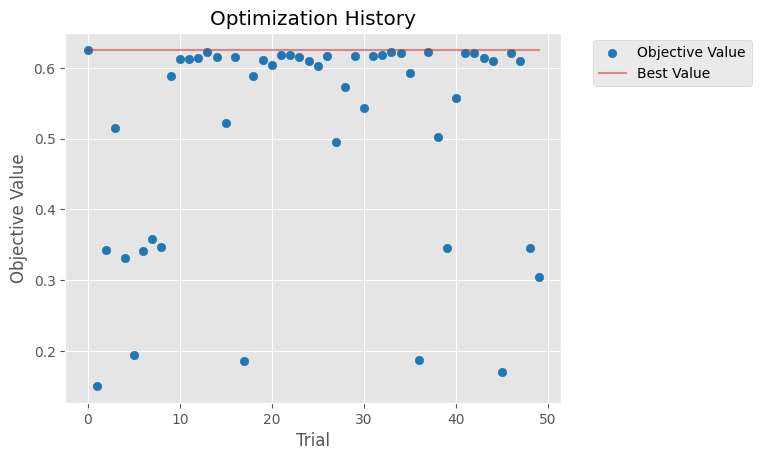

/var/folders/nf/hrcncw914s9908b7gbhwy_g00000gn/T/ipykernel_56576/4157074307.py:24: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  optuna.visualization.matplotlib.plot_param_importances(study)


<Figure size 1000x600 with 0 Axes>

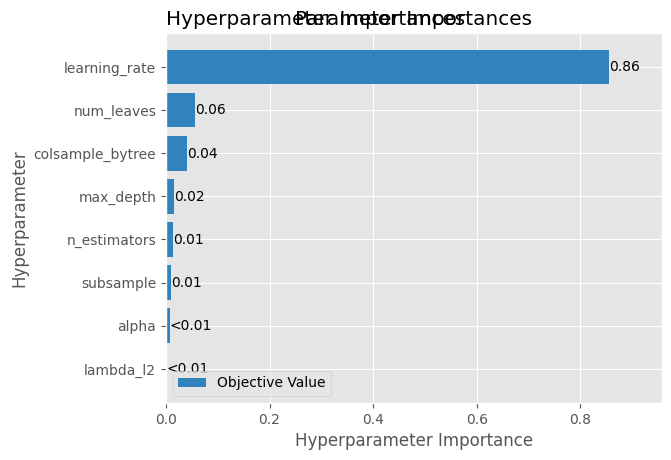

In [28]:
# Evaluate on training data
y_train_pred = final_model.predict(x_train)
print("\nTraining Data Results:")
print("Accuracy:", accuracy_score(y_train_encoded, y_train_pred))
print("\nClassification Report:")
print(classification_report(y_train_encoded, y_train_pred, zero_division=0))

# Evaluate on validation data
y_val_encoded = label_encoder.transform(y_val)  # Transform validation labels to integers
y_val_pred = final_model.predict(x_val)
print("\nValidation Data Results:")
print("Accuracy:", accuracy_score(y_val_encoded, y_val_pred))
print("\nClassification Report:")
print(classification_report(y_val_encoded, y_val_pred, zero_division=0))

# Plot the optimization history
plt.figure(figsize=(10, 6))
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.title('Optimization History')
plt.show()

# Plot parameter importances
plt.figure(figsize=(10, 6))
optuna.visualization.matplotlib.plot_param_importances(study)
plt.title('Parameter Importances')
plt.show()

In [29]:
#@title Test Data


# let's take a look at the first 5 lines of the file
test_data_path = "test-classification-round1.dat"
!head -n 5 "$test_data_path"

print("*****")

test_unames = []
with open(test_data_path, "rt") as fh:
  for line in fh:
    test_unames.append(line.strip())

print(test_unames[:5])

ozhotelstr
elleturkiye
sozerinsaatorhangazi
sanliurfapiazzaavym
rusanozden
*****
['ozhotelstr', 'elleturkiye', 'sozerinsaatorhangazi', 'sanliurfapiazzaavym', 'rusanozden']


In [30]:
x_test = []

for uname in test_unames:
  try:
    index = test_usernames.index(uname)
    x_test.append(x_post_test[index].toarray()[0])
  except Exception as e:
    try:
      index = train_usernames.index(uname)
      x_test.append(x_post_train[index].toarray()[0])
    except Exception as e:
      print(uname)


test_unames.remove("screenname")

screenname


In [31]:
df_test = pd.DataFrame(np.array(x_test), columns=feature_names)
df_test.head(2)

,about,adana,adet,adres,adım,adına,afiyet,ahmet,aile,ailesi,...,üzerinde,üzerinden,üzerine,üç,şehir,şehrin,şeker,şekilde,şimdi,şık
0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000
1,0.0,0.0,0.0,0.0,0.008082,0.0,0.0,0.010069,0.0,0.0,...,0.0,0.0,0.0,0.009397,0.0,0.0,0.0,0.012105,0.0,0.018577


In [32]:
test_pred = final_model.predict(df_test)
decoded_preds = label_encoder.inverse_transform(test_pred)

output = dict()
for index, uname in enumerate(test_unames):
    # for nb, lr, rf, svm output[uname] = test_pred[index]
    output[uname] = decoded_preds[index] # for xgb

[LightGBM] [Warning] lambda_l2 is set=0.0002451147486273565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002451147486273565


In [80]:
def format_category(category):
    # Split the category into words and apply title casing
    words = category.split()
    # Capitalize each word except "and"
    formatted_words = [word.capitalize() if word != "and" else word for word in words]
    return " ".join(formatted_words)

output = dict()
for index, uname in enumerate(test_unames):
    # Format the predicted category
    output[uname] = format_category(decoded_preds[index])

# Write the updated output to a JSON file
with open("output.json", "w") as of:
    json.dump(output, of, indent=4)

# Like Count Prediction


Here, we use the average like_count of the user's previous posts to predict each post's like_count

In [36]:
train_profile_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2829 entries, 0 to 2828
Data columns (total 44 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   username                           2829 non-null   object
 1   id                                 2829 non-null   object
 2   full_name                          2801 non-null   object
 3   biography                          2653 non-null   object
 4   category_name                      2302 non-null   object
 5   post_count                         282 non-null    object
 6   follower_count                     2829 non-null   object
 7   following_count                    2829 non-null   object
 8   is_business_account                2829 non-null   object
 9   is_private                         2829 non-null   object
 10  is_verified                        2829 non-null   object
 11  highlight_reel_count               2829 non-null   object
 12  bio_li

In [ ]:
# category_name 
# follower_count
# is_business_account
# is_private
# is_verified
# has_clips
# hide_like_and_view_counts
# is_professional_account
# is_joined_recently
# business_category_name
# category_enum
# should_show_category
# total like (I will extract this from like_count of each post) / post_count

In [37]:
next(iter(username2posts_train.items()))

('deparmedya',
 [{'caption': 'Cumhuriyetimizin 100.yılı kutlu olsun♾️🇹🇷',
   'comments_count': 0,
   'id': '17990918969458720',
   'like_count': 6,
   'media_type': 'IMAGE',
   'media_url': 'https://scontent-sof1-2.cdninstagram.com/v/t51.29350-15/396342908_267936919574308_4264417069827989599_n.jpg?_nc_cat=107&ccb=1-7&_nc_sid=c4dd86&_nc_ohc=IynXuQSoOT8AX9RSy20&_nc_ht=scontent-sof1-2.cdninstagram.com&edm=AL-3X8kEAAAA&oh=00_AfA8OKAM0MY9tqg6dw8C8I5TJp4SHPBp-VlNXrFAh2agqg&oe=6563581C',
   'timestamp': '2023-10-29 09:12:30'},
  {'caption': 'Oriflame Duologi Lansmanı #isveçtengelengüzellik #oriflameilesaçbakımdevrimi',
   'comments_count': 1,
   'id': '18219250732221045',
   'like_count': 22,
   'media_type': 'VIDEO',
   'media_url': 'https://scontent-sof1-2.cdninstagram.com/o1/v/t16/f1/m82/FB43CFCD94D54CB5DC585E1777FB28B8_video_dashinit.mp4?efg=eyJ2ZW5jb2RlX3RhZyI6InZ0c192b2RfdXJsZ2VuLmNsaXBzLnVua25vd24tQzMuNzIwLmRhc2hfYmFzZWxpbmVfMV92MSJ9&_nc_ht=scontent-sof1-2.cdninstagram.com&_nc_cat=111&

In [49]:
def average_like_count(username, current_post=None):
    total = 0.0
    count = 0

    # Determine which dataset to use
    if username in username2posts_train:
        posts = username2posts_train[username]
    elif username in username2posts_test:
        posts = username2posts_test[username]
    else:
        print(f"No data available for {username}")
        return -1

    for post in posts:
        if current_post is not None and post["id"] == current_post["id"]:
            continue

        like_count = post.get("like_count", 0) or 0
        total += like_count
        count += 1

    if count == 0:
        return 0.0

    return total / count

In [50]:
average_like_count('deparmedya')

11.542857142857143

In [75]:
import pandas as pd

# Assuming train_profile_df is your original DataFrame
# If not already loaded, load it accordingly
# Example:
# train_profile_df = pd.read_csv('your_data.csv')

# Define the columns to include in task2_train_df
columns_to_include = [
    'username',
    'id',
    'follower_count',
    'is_business_account',
    'is_private',
    'is_verified',
    'has_clips',
    'hide_like_and_view_counts',
    'is_professional_account',
    'is_joined_recently',
    'should_show_category'
]

# Create a copy of the selected columns
task2_train_df = train_profile_df[columns_to_include].copy()

# Convert 'follower_count' to numeric (int)
task2_train_df['follower_count'] = pd.to_numeric(task2_train_df['follower_count'], errors='coerce').fillna(0).astype(int)

# Define boolean-like columns that need to be converted to 1 and 0
boolean_cols = [
    'is_business_account',
    'is_private',
    'is_verified',
    'has_clips',
    'hide_like_and_view_counts',
    'is_professional_account',
    'is_joined_recently',
    'should_show_category'
]

# Define a mapping dictionary
bool_mapping = {
    'True': 1,
    'False': 0,
    'true': 1,
    'false': 0,
    '1': 1,
    '0': 0,
    True: 1,    # In case there are actual boolean types
    False: 0
}

# Apply the mapping to each boolean-like column
for col in boolean_cols:
    task2_train_df[col] = task2_train_df[col].replace(bool_mapping)
    task2_train_df[col] = task2_train_df[col].fillna(0).astype(int)

# Verify the transformations
print("\nData types of task2_train_df:")
print(task2_train_df.dtypes)

print("\nSummary of null values in task2_train_df:")
print(task2_train_df.isnull().sum())

print("\nUnique values in boolean-like columns:")
for col in boolean_cols:
    print(f"{col}: {task2_train_df[col].unique()}")


Data types of task2_train_df:
username                     object
id                           object
follower_count                int64
is_business_account           int64
is_private                    int64
is_verified                   int64
has_clips                     int64
hide_like_and_view_counts     int64
is_professional_account       int64
is_joined_recently            int64
should_show_category          int64
dtype: object

Summary of null values in task2_train_df:
username                     0
id                           0
follower_count               0
is_business_account          0
is_private                   0
is_verified                  0
has_clips                    0
hide_like_and_view_counts    0
is_professional_account      0
is_joined_recently           0
should_show_category         0
dtype: int64

Unique values in boolean-like columns:
is_business_account: [1 0]
is_private: [0 1]
is_verified: [0 1]
has_clips: [1 0]
hide_like_and_view_counts: [0 1]
is_profe

/var/folders/nf/hrcncw914s9908b7gbhwy_g00000gn/T/ipykernel_56576/1212465662.py:55: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  task2_train_df[col] = task2_train_df[col].replace(bool_mapping)
/var/folders/nf/hrcncw914s9908b7gbhwy_g00000gn/T/ipykernel_56576/1212465662.py:55: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  task2_train_df[col] = task2_train_df[col].replace(bool_mapping)
/var/folders/nf/hrcncw914s9908b7gbhwy_g00000gn/T/ipykernel_56576/1212465662.py:55: FutureWarning: Downcasting behavior in `replace` is deprecated and 

In [76]:
task2_train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2829 entries, 0 to 2828
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   username                   2829 non-null   object
 1   id                         2829 non-null   object
 2   follower_count             2829 non-null   int64 
 3   is_business_account        2829 non-null   int64 
 4   is_private                 2829 non-null   int64 
 5   is_verified                2829 non-null   int64 
 6   has_clips                  2829 non-null   int64 
 7   hide_like_and_view_counts  2829 non-null   int64 
 8   is_professional_account    2829 non-null   int64 
 9   is_joined_recently         2829 non-null   int64 
 10  should_show_category       2829 non-null   int64 
dtypes: int64(9), object(2)
memory usage: 243.2+ KB


In [77]:
import pandas as pd
from tqdm import tqdm

# Initialize tqdm for pandas
tqdm.pandas()

# Define the average_like_count function
def average_like_count(username, current_post=None):
    """
    Calculate the average number of likes per post for a given username.
    
    Parameters:
    - username (str): The username to calculate the average likes for.
    - current_post (dict, optional): A post to exclude from the calculation (e.g., if predicting for this post).
    
    Returns:
    - float: The average like count. Returns -1 if no data is available.
    """
    total = 0.0
    count = 0

    # Determine which dataset to use
    if username in username2posts_train:
        posts = username2posts_train[username]
    elif username in username2posts_test:
        posts = username2posts_test[username]
    else:
        print(f"No data available for {username}")
        return -1

    for post in posts:
        if current_post is not None and post["id"] == current_post["id"]:
            continue

        like_count = post.get("like_count", 0) or 0
        total += like_count
        count += 1

    if count == 0:
        return 0.0

    return total / count

# Define the columns to include in task2_train_df
columns_to_include = [
    'username',
    'id',
    'follower_count',
    'is_business_account',
    'is_private',
    'is_verified',
    'has_clips',
    'hide_like_and_view_counts',
    'is_professional_account',
    'is_joined_recently',
    'should_show_category'
]

# Create a copy of the selected columns
task2_train_df = train_profile_df[columns_to_include].copy()

# Convert 'follower_count' to numeric (int)
task2_train_df['follower_count'] = pd.to_numeric(task2_train_df['follower_count'], errors='coerce').fillna(0).astype(int)

# Define boolean-like columns that need to be converted to 1 and 0
boolean_cols = [
    'is_business_account',
    'is_private',
    'is_verified',
    'has_clips',
    'hide_like_and_view_counts',
    'is_professional_account',
    'is_joined_recently',
    'should_show_category'
]

# Define a mapping dictionary
bool_mapping = {
    'True': 1,
    'False': 0,
    'true': 1,
    'false': 0,
    '1': 1,
    '0': 0,
    True: 1,    # In case there are actual boolean types
    False: 0
}

# Apply the mapping to each boolean-like column
for col in boolean_cols:
    task2_train_df[col] = task2_train_df[col].replace(bool_mapping)
    task2_train_df[col] = task2_train_df[col].fillna(0).astype(int)

# Verify the transformations
print("\nData types of task2_train_df:")
print(task2_train_df.dtypes)

print("\nSummary of null values in task2_train_df:")
print(task2_train_df.isnull().sum())

print("\nUnique values in boolean-like columns:")
for col in boolean_cols:
    print(f"{col}: {task2_train_df[col].unique()}")

# Add the 'average_likes' column
task2_train_df['average_likes'] = task2_train_df['username'].progress_apply(average_like_count)

# Replace -1 with NaN (or another value if preferred)
task2_train_df['average_likes'] = task2_train_df['average_likes'].replace(-1, pd.NA)
# Alternatively, replace -1 with 0
# task2_train_df['average_likes'] = task2_train_df['average_likes'].replace(-1, 0)

# Verify the 'average_likes' column
print("\nData types of task2_train_df after adding 'average_likes':")
print(task2_train_df.dtypes)

print("\nSummary of 'average_likes' column:")
print(task2_train_df['average_likes'].describe())

print("\nSample of task2_train_df with 'average_likes':")
print(task2_train_df.head())

# Optionally, save the updated DataFrame
# task2_train_df.to_csv('task2_train_df_with_average_likes.csv', index=False)
# task2_train_df.to_pickle('task2_train_df_with_average_likes.pkl')

/var/folders/nf/hrcncw914s9908b7gbhwy_g00000gn/T/ipykernel_56576/1153857825.py:91: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  task2_train_df[col] = task2_train_df[col].replace(bool_mapping)
/var/folders/nf/hrcncw914s9908b7gbhwy_g00000gn/T/ipykernel_56576/1153857825.py:91: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  task2_train_df[col] = task2_train_df[col].replace(bool_mapping)
/var/folders/nf/hrcncw914s9908b7gbhwy_g00000gn/T/ipykernel_56576/1153857825.py:91: FutureWarning: Downcasting behavior in `replace` is deprecated and 


Data types of task2_train_df:
username                     object
id                           object
follower_count                int64
is_business_account           int64
is_private                    int64
is_verified                   int64
has_clips                     int64
hide_like_and_view_counts     int64
is_professional_account       int64
is_joined_recently            int64
should_show_category          int64
dtype: object

Summary of null values in task2_train_df:
username                     0
id                           0
follower_count               0
is_business_account          0
is_private                   0
is_verified                  0
has_clips                    0
hide_like_and_view_counts    0
is_professional_account      0
is_joined_recently           0
should_show_category         0
dtype: int64

Unique values in boolean-like columns:
is_business_account: [1 0]
is_private: [0 1]
is_verified: [0 1]
has_clips: [1 0]
hide_like_and_view_counts: [0 1]
is_profe

100%|████████████████████████████████████| 2829/2829 [00:00<00:00, 65445.63it/s]


Data types of task2_train_df after adding 'average_likes':
username                      object
id                            object
follower_count                 int64
is_business_account            int64
is_private                     int64
is_verified                    int64
has_clips                      int64
hide_like_and_view_counts      int64
is_professional_account        int64
is_joined_recently             int64
should_show_category           int64
average_likes                float64
dtype: object

Summary of 'average_likes' column:
count      2829.000000
mean       5751.427738
std       33985.804136
min           0.000000
25%          27.085714
50%          78.942857
75%         382.457143
max      882625.171429
Name: average_likes, dtype: float64

Sample of task2_train_df with 'average_likes':
               username          id  follower_count  is_business_account  \
0            deparmedya  3170700063            1167                    1   
1            kafesfirin   

In [78]:
task2_train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2829 entries, 0 to 2828
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   username                   2829 non-null   object 
 1   id                         2829 non-null   object 
 2   follower_count             2829 non-null   int64  
 3   is_business_account        2829 non-null   int64  
 4   is_private                 2829 non-null   int64  
 5   is_verified                2829 non-null   int64  
 6   has_clips                  2829 non-null   int64  
 7   hide_like_and_view_counts  2829 non-null   int64  
 8   is_professional_account    2829 non-null   int64  
 9   is_joined_recently         2829 non-null   int64  
 10  should_show_category       2829 non-null   int64  
 11  average_likes              2829 non-null   float64
dtypes: float64(1), int64(9), object(2)
memory usage: 265.3+ KB


In [79]:
task2_train_df

,username,id,follower_count,is_business_account,is_private,is_verified,has_clips,hide_like_and_view_counts,is_professional_account,is_joined_recently,should_show_category,average_likes
0,deparmedya,3170700063,1167,1,0,0,1,0,1,0,1,11.542857
1,kafesfirin,266439571,11997,1,0,0,1,0,1,0,1,31.514286
2,vimerang,2367195567,2321,1,0,0,1,1,1,0,1,233.885714
3,mustafa_yalcinn38,9606564254,13647,1,0,1,1,0,1,0,1,361.342857
4,zorluenergysolutions,8155780357,7917,1,0,1,1,0,1,0,1,72.800000
...,...,...,...,...,...,...,...,...,...,...,...,...
2824,tatlidunyasidergisi,5726272058,9259,1,0,0,1,0,1,0,1,12.257143
2825,yerindengelsin.com.tr,4755951986,1149,1,0,0,1,0,1,0,1,19.285714
2826,woodtechistanbul,39207633113,1065,1,0,0,1,0,1,0,0,14.600000
2827,netsvadi,2219868064,1379,1,0,0,1,0,1,0,1,8.885714
